In [1]:
%config InlineBackend.figure_format = 'retina'
# %matplotlib qt

# PSF photometry of NGC 2210

In this tutorial we will conduct some basic PSF photometry on a DESI Legacy Survey image of the globular cluster NGC 2210.
We will use the `photutils.psf` module to perform PSF photometry on the image. We will use the `photutils.psf` module to create a PSF model from the image and use it to perform PSF photometry.

Below image shows each frame of grz band and their false-color image of the NGC 2210, whose center is located on the left bottom of the images.

![](./data/proj2/NGC2210.grz.png)



In [2]:

import copy
from pathlib import Path
from matplotlib import patches
from matplotlib import pyplot as plt
import numpy as np
import sys
from time import time, ctime
import warnings
from astropy.io import fits
from astropy.table import Table, hstack, vstack
from astropy.modeling.fitting import LevMarLSQFitter
from astropy.stats import sigma_clipped_stats, gaussian_fwhm_to_sigma
from astropy.table import Table
from astropy.nddata import NDData, CCDData
from astropy.utils.exceptions import AstropyWarning
from astropy.visualization import simple_norm, ZScaleInterval
from photutils.aperture import CircularAperture, ApertureStats
from photutils.detection import DAOStarFinder, find_peaks
from photutils.psf import extract_stars, EPSFBuilder
from photutils.psf import DAOPhotPSFPhotometry, BasicPSFPhotometry
from photutils.psf import DAOGroup
from photutils.psf.epsf_stars import EPSFStars
from photutils.psf.utils import _extract_psf_fitting_names
from photutils.psf.utils import get_grouped_psf_model
from photutils.detection import IRAFStarFinder
from photutils.background import MMMBackground, MADStdBackgroundRMS
from photutils.segmentation import make_source_mask
from mpl_toolkits.axes_grid1 import make_axes_locatable
import sep

sys.setrecursionlimit(10**7)
plt.rcParams["font.family"] = 'Times New Roman'
plt.rcParams["font.size"] = 15
plt.rcParams["text.usetex"] = False
plt.rcParams["mathtext.fontset"] = 'cm'

warnings.simplefilter('ignore', category=AstropyWarning)

HOME = Path.home()
DATADIR = HOME/'class'/'tao23'/'TAO23'/'tutorials'/'data'/'proj2'

In [3]:
def zscale_imshow(ax, img, vmin=None, vmax=None, **kwargs):
    if vmin==None or vmax==None:
        interval = ZScaleInterval()
        _vmin, _vmax = interval.get_limits(img)
        if vmin==None:
            vmin = _vmin
        if vmax==None:
            vmax = _vmax
    im = ax.imshow(img, vmin=vmin, vmax=vmax, origin='lower', **kwargs)
    
    return im

def read_sci_data(fpath, show=True, newbyteorder=False, bkgsubtract=False):
    ccd_raw = CCDData.read(fpath, unit='nmgy') # be careful about the unit!
    ccd = CCDData.read(fpath, unit='nmgy')
    
    data = ccd.data
    
    data_mean, data_med, data_std = sigma_clipped_stats(data, sigma=2.)
    ccd.mask = data < data_mean - 3*data_std 
    ccd.data[ccd.mask] = data_med
    ccd.data -= data_med
    ccd.mask = (ccd.mask) & (data > 10.)
    if newbyteorder:
        ccd.data = ccd.data.byteswap().newbyteorder()
        
    n = len(ccd.data)
    if bkgsubtract:
        bkgsubs = []
        for i in range(n):
            bkgsub = background_substraction(ccd.data[i])
            bkgsubs.append(bkgsub)
        ccd.data = np.array(bkgsubs)
    
    if show:
        fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
        for i in range(n):
            im = zscale_imshow(axes[i], ccd.data[i], cmap='gray')
            divider = make_axes_locatable(axes[i])
            cax = divider.append_axes('right', size='5%', pad=0.05)
            fig.colorbar(im, cax=cax, orientation='vertical')
            
            band = ccd.header[f'BAND{i}']
            
            axes[i].text(0.98, 0.02, f'${band}$-band',
                         transform=axes[i].transAxes,
                         va='bottom', ha='right', c='k',
                         bbox=dict(boxstyle='round', facecolor='w', alpha=0.9))
            
        plt.tight_layout()
        
    return ccd, ccd_raw

def background_substraction(img, box=100, filt=3, show=True):
    mask = make_source_mask(img, nsigma=2, npixels=1, dilate_size=3)
    bkg_sep = sep.Background(img.byteswap().newbyteorder(), 
                             mask=mask, bw=box, bh=box, fw=filt, fh=filt)
    bkgsub_sep = img - bkg_sep.back()
    
    if show:
        fig, axs = plt.subplots(2, 3, figsize=(10, 8))
        axs[1, 1].axis("off")
        
        data2plot = [
            dict(ax=axs[0, 0], arr=img,              title="Original data"),
            dict(ax=axs[0, 1], arr=bkg_sep.back(),   title=f"bkg (filt={filt:d}, box={box:d})"),
            dict(ax=axs[0, 2], arr=bkgsub_sep,       title="bkg subtracted"),
            dict(ax=axs[1, 0], arr=mask,             title="Mask"),
            # dict(ax=axs[1, 1], arr=bkg_sep.background_mesh,   title="bkg mesh"),
            dict(ax=axs[1, 2], arr=10*bkg_sep.rms(), title="10 * bkg RMS")
        ]
        
        for dd in data2plot:
            im = zscale_imshow(dd['ax'], dd['arr'])
            cb = fig.colorbar(im, ax=dd['ax'], orientation='horizontal')
            # cb.ax.set_xticklabels([f'{x:.3f}' for x in cb.get_ticks()])#, rotation=45)
            dd['ax'].set_title(dd['title'])
        
        plt.tight_layout()
    
    return bkgsub_sep

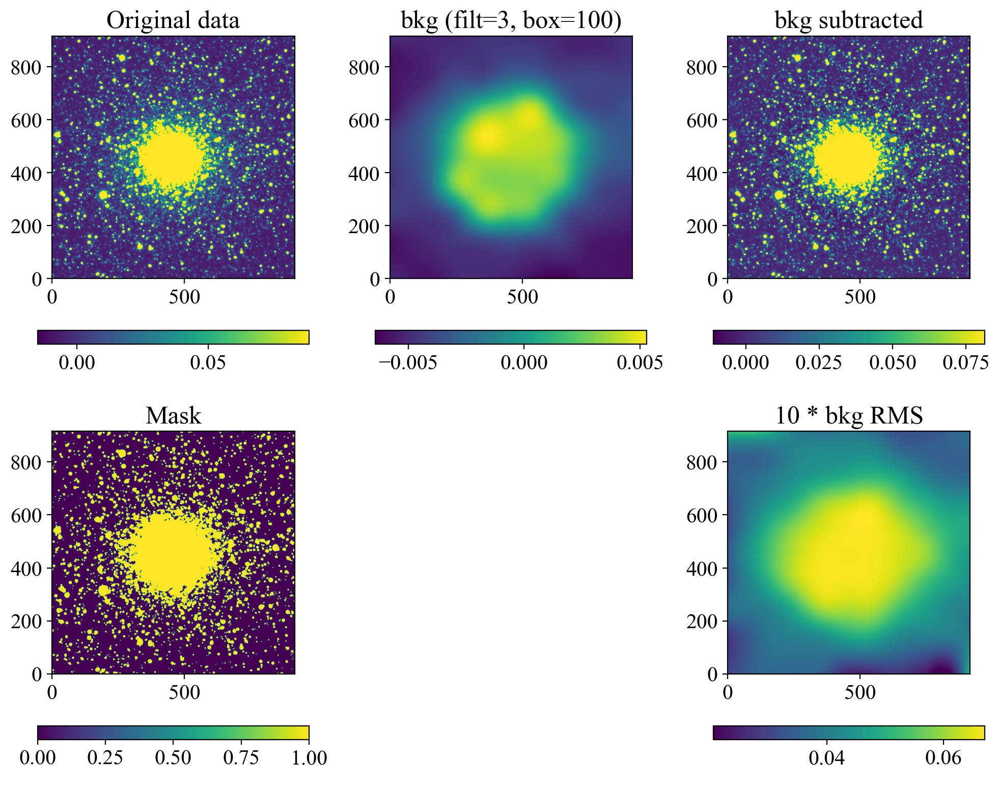

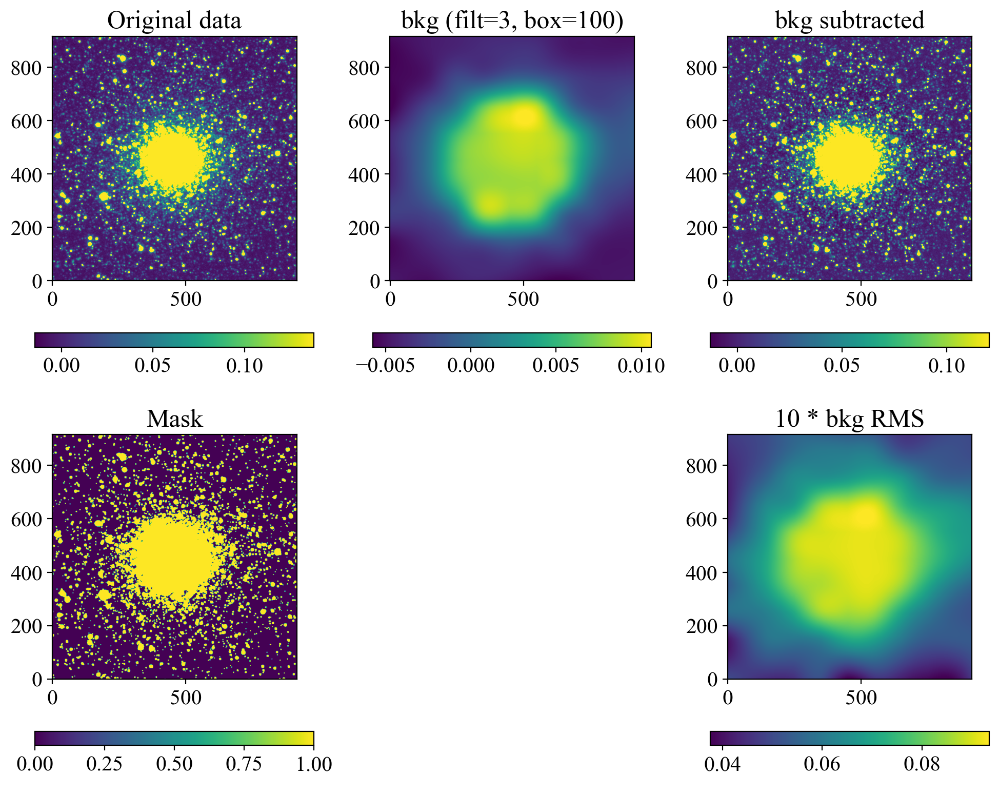

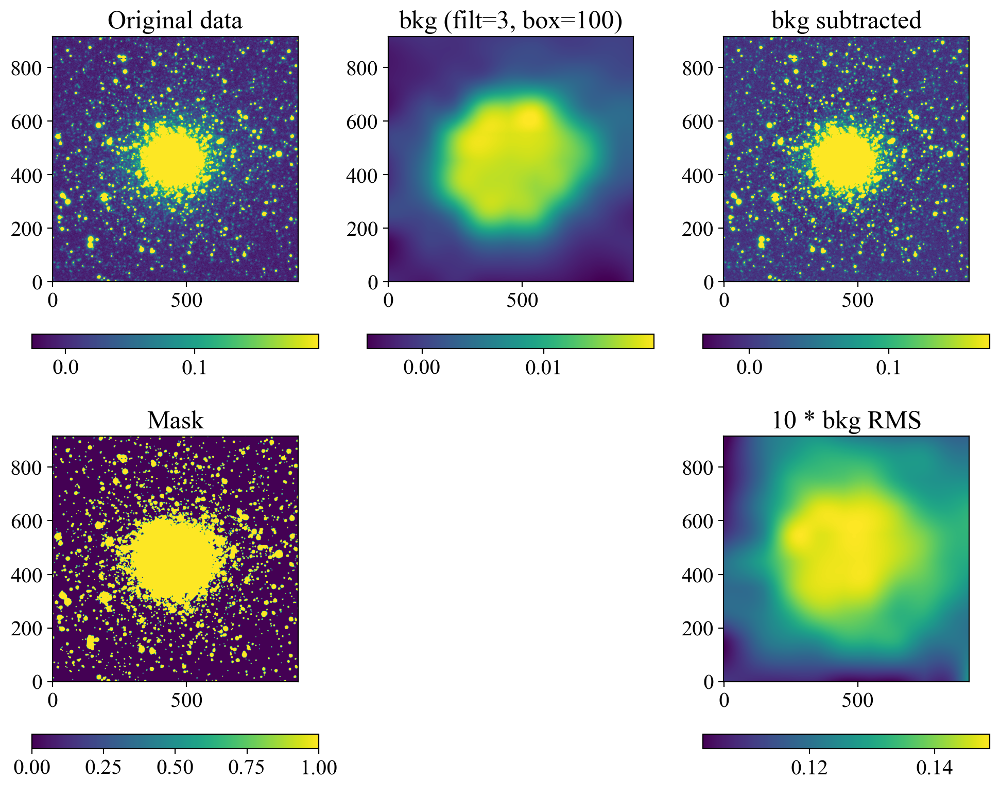

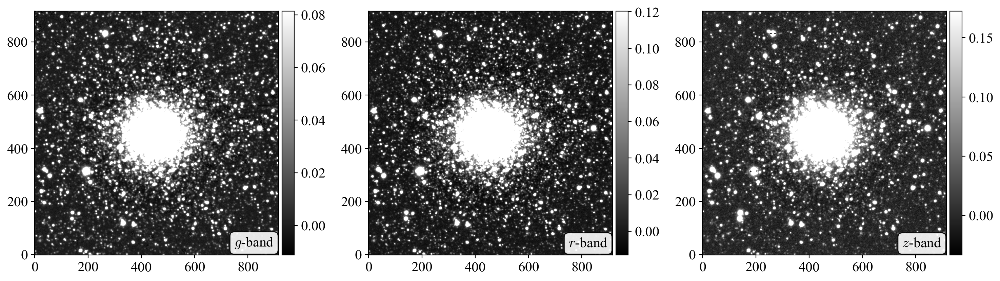

In [4]:
ccd, ccd_raw = read_sci_data(DATADIR/'NGC2210.grz.fits', bkgsubtract=True)

x_peak y_peak  peak_value
------ ------ -----------
   279      0 0.031193513
   332      0 0.015336676
   422      0 0.033575885
   483      0  0.10034447
   624      0 0.017137498
   737      0 0.038308792
    50      1 0.014401553
   ...    ...         ...
   293    915 0.064567275
   489    915  0.62563419
   524    915  0.10758238
   543    915 0.019372355
   657    915  0.10819479
   683    915 0.017293567
   793    915 0.021367788
   864    915 0.019625213
Length = 3780 rows
 x   y 
--- ---
192  12
173  17
788  47
368  48
490  55
690  79
888  96
... ...
400 848
459 849
710 853
881 859
786 860
504 866
817 892
101 895
Length = 150 rows


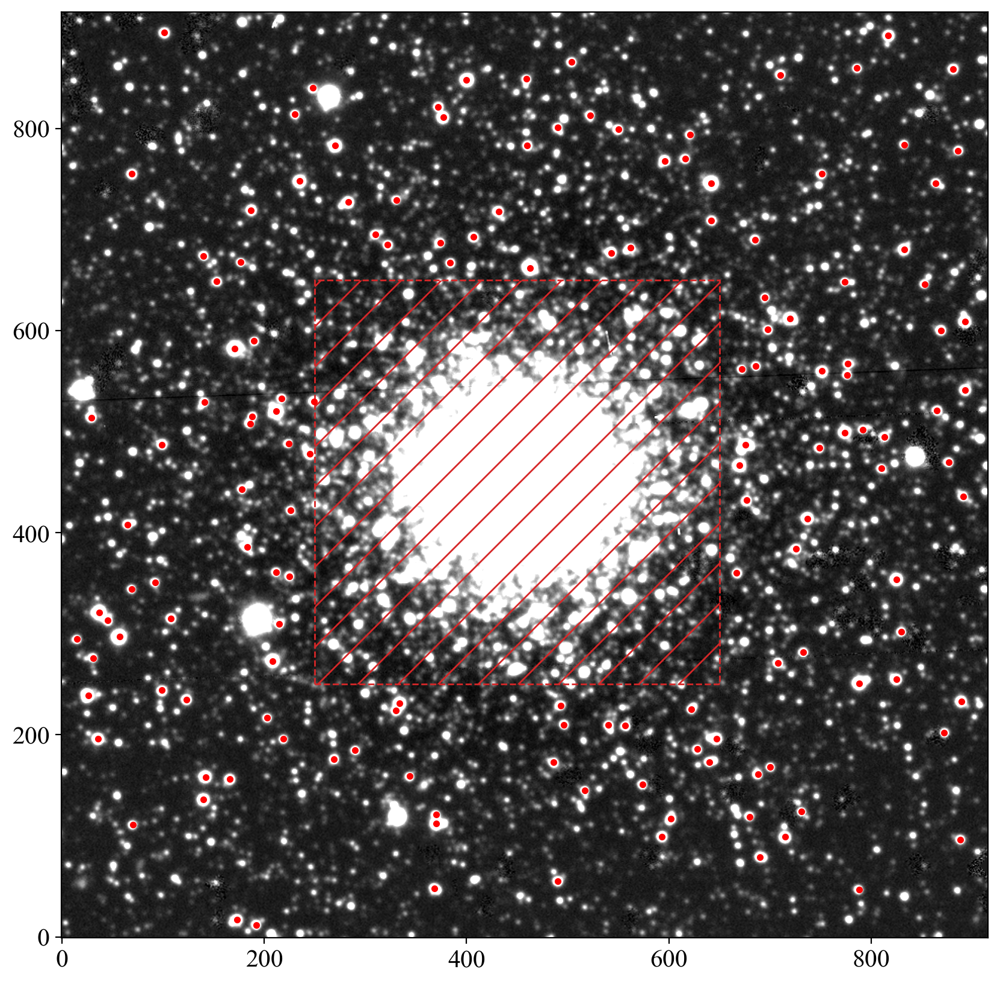

In [5]:
bands = ['g', 'r', 'z']
i = 0
band = bands[i]
data = ccd.data[i]
mask = ccd.mask[i]

bkgrms = MADStdBackgroundRMS()
std = bkgrms(data)
thres = 3*std

find_mask = np.zeros_like(data, dtype=bool)
# find_mask[250:650, 250:650] = True
# ll, hh = 0, 200
ll, hh = 250, 650
find_mask[ll:hh, ll:hh] = True
peaks_tbl = find_peaks(data, threshold=thres, mask=find_mask)
peaks_tbl['peak_value'].info.format = '%.8g'

print(peaks_tbl)

# select stars within the cutout of specified size, which must be odd
size = 21 # typically ~4*FWHM. user should consider the PSF size for selecting this value
hsize = (size - 1) / 2
x = peaks_tbl['x_peak']  
y = peaks_tbl['y_peak']  
bound = ((x > hsize) & (x < (data.shape[1] -1 - hsize)) &
         (y > hsize) & (y < (data.shape[0] -1 - hsize)))
bright = (peaks_tbl['peak_value'] > 0.5) & (peaks_tbl['peak_value'] < 10.)

bbmask = (bound & bright)
bx, by = x[bbmask], y[bbmask]

isolated = [False if np.count_nonzero(np.sqrt((bx-xi)**2+(by-yi)**2)<size) > 1
            else True for xi, yi in zip(bx, by)]

mask_stars = isolated
mask_stars = np.ones_like(bx, dtype=bool)

stars_tbl = Table()
stars_tbl['x'] = bx[mask_stars]  
stars_tbl['y'] = by[mask_stars]

print(stars_tbl)

nddata = NDData(data=data, mask=ccd.mask[i])

# plot the locations of our selected stars
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
im = zscale_imshow(ax, data, cmap='gray')
ax.plot(stars_tbl['x'], stars_tbl['y'], '.r')
rect = patches.Rectangle((ll,ll), hh-ll, hh-ll, ec='tab:red', ls='--',
                         hatch='/', fc='none', lw=1)
ax.add_patch(rect)

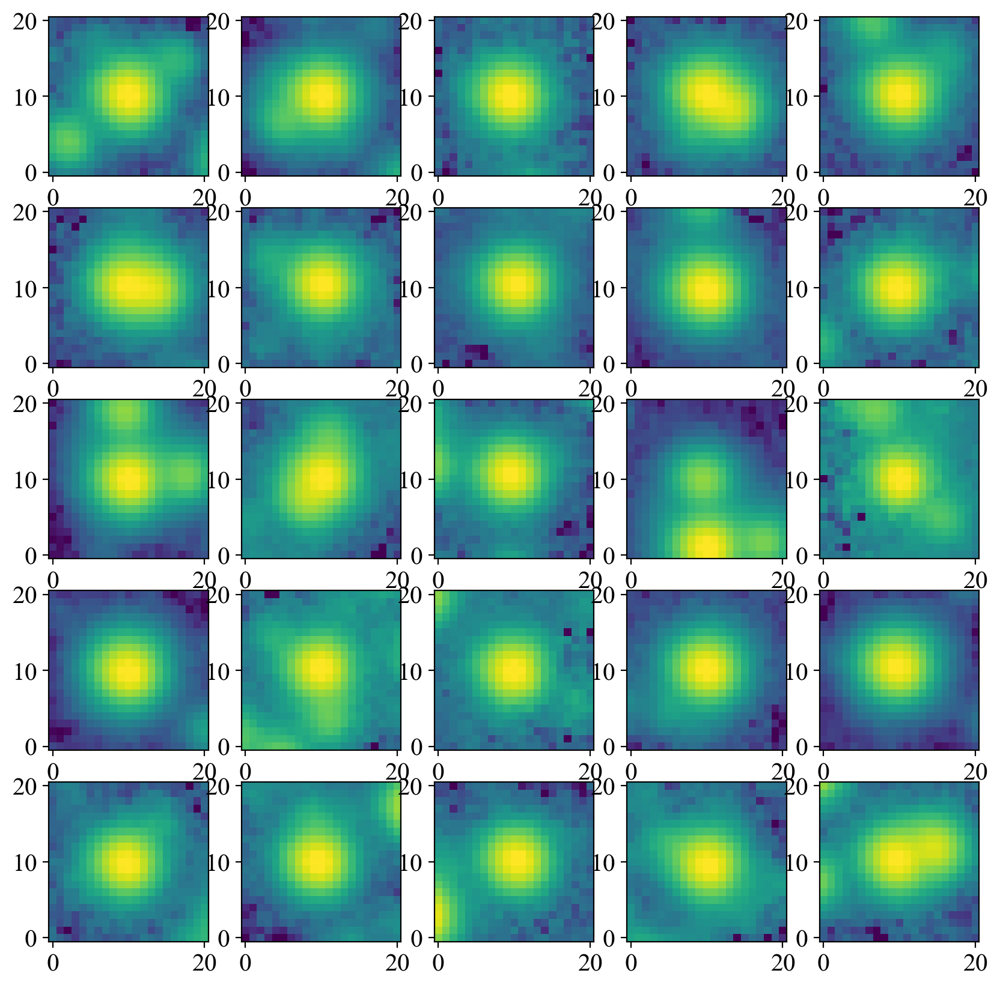

In [6]:
# extract cutouts of our selected stars
stars = extract_stars(nddata, stars_tbl, size=size)

# plot cutouts
nrows = 5
ncols = 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 10),
                       squeeze=True)
ax = ax.ravel()
for i in range(nrows * ncols):
    norm = simple_norm(stars[i], 'log', percent=99.0)
    ax[i].imshow(stars[i], norm=norm, origin='lower', cmap='viridis')

# derive fwhm from aperture statistics
cap = CircularAperture(stars.center_flat, size/5.)
apstat = ApertureStats(data, cap)

fwhm_mean, fwhm_med, fwhm_std = sigma_clipped_stats(apstat.fwhm.value,
                                                    sigma=3.0)

In [7]:

def get_epsf(stars, band,
             oversampling=4, maxiters=10, smoothing_kernel='quadratic',
             show=True, ncols=10, figsize=(10, 15)):
    
    if show:
        nrows = int(np.ceil(len(stars)/ncols))
        fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize,
                               squeeze=True)
        axs = axs.ravel()
        for ax in axs:
            ax.axis('off')
        for i in range(len(stars)):
            norm = simple_norm(stars[i], 'log', percent=99.)
            axs[i].imshow(stars[i], norm=norm, origin='lower', cmap='viridis')
        fig.text(0.95,0.05,f'{band}-band',
                  ha='right', va='bottom', fontsize=15)
        # plt.title(f'Picked stars to model PSF ({band})')
        plt.tight_layout()
        
    epsf_builder = EPSFBuilder(oversampling=oversampling, maxiters=maxiters,
                               progress_bar=False,
                               smoothing_kernel=smoothing_kernel)  
    epsf, fitted_stars = epsf_builder(stars)
    
    if show:
        plt.figure()
        norm = simple_norm(epsf.data, 'log', percent=99.)
        plt.imshow(epsf.data, norm=norm, origin='lower', cmap='viridis')
        plt.title(f'Effective PSF ({band})')
        plt.colorbar()
        
    return epsf


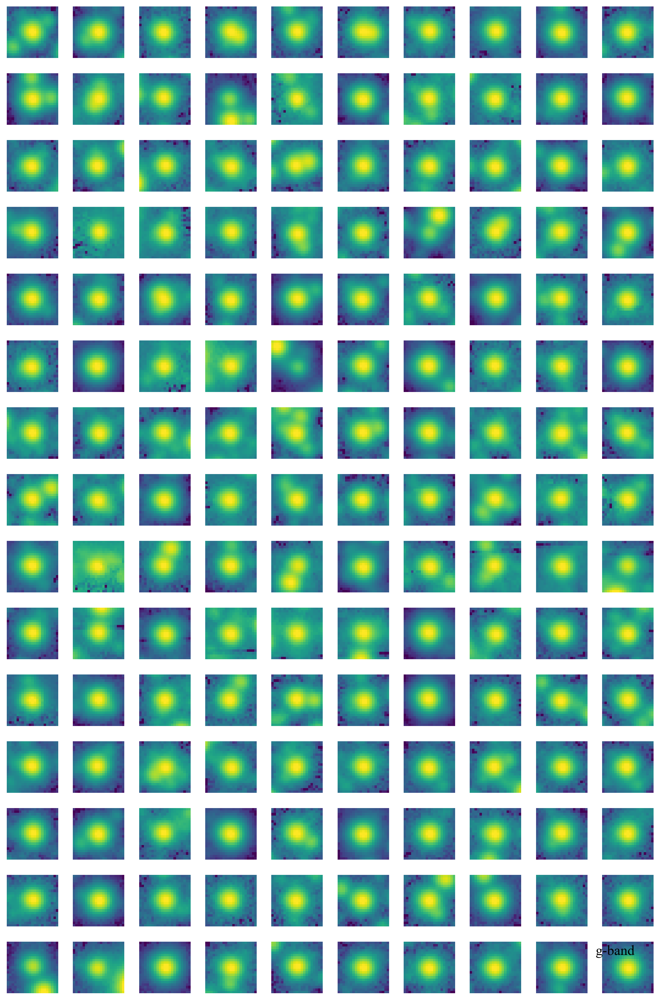

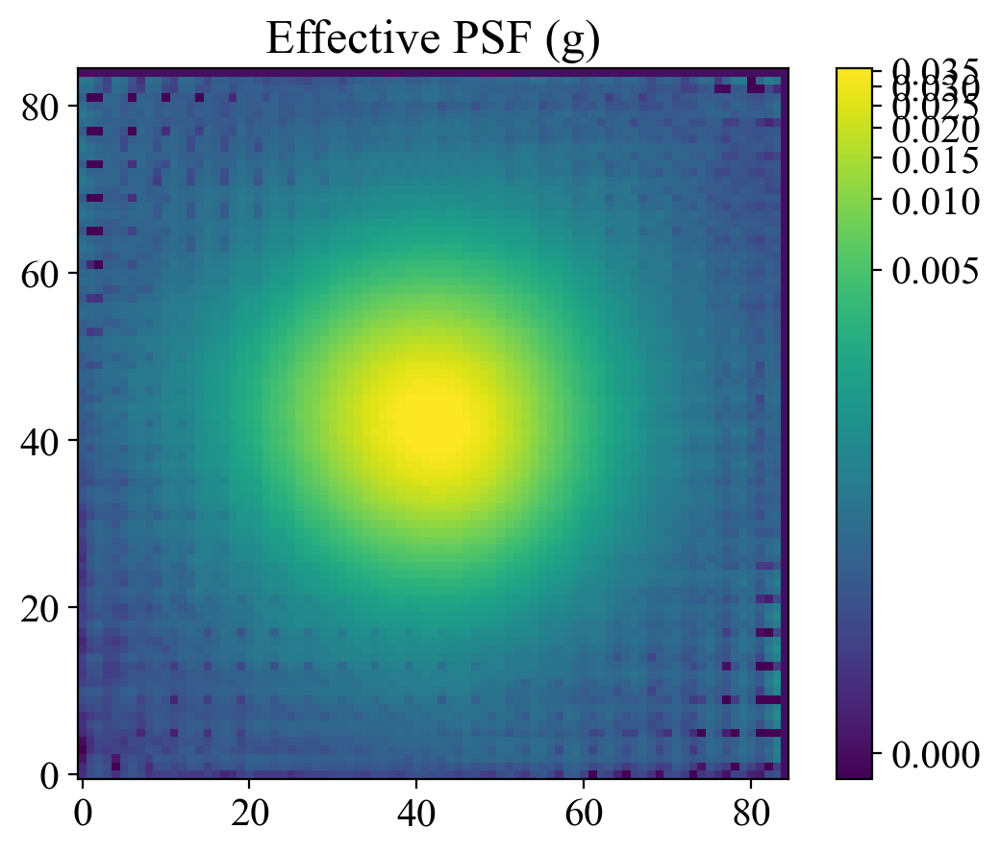

In [8]:
epsf0 = get_epsf(stars, band)

In [10]:
# substar procedure
# subtract adjacent star profiles using the epsf model we obtained.

def get_substars(stars, psf_model, thres, fwhm, band, peakmax=None,
            show=True, ncols=10, figsize=(10, 15)):
    substars_list = []
    for star in stars:
        finder = DAOStarFinder(threshold=thres, fwhm=fwhm,
                               roundhi=5.0, roundlo=-5.0,
                               sharplo=0.0, sharphi=2.0, peakmax=peakmax)
        found = finder(star.data)
        found.rename_columns(['xcentroid', 'ycentroid', 'flux'],
                             ['x_0', 'y_0', 'flux_0'])
        if len(found) > 1:
            fitter = LevMarLSQFitter()
            y, x = np.indices(star.shape)
            xname, yname, fluxname = _extract_psf_fitting_names(psf_model)
            pars_to_set = {'x_0': xname, 'y_0': yname, 'flux_0': fluxname}
            group_psf = get_grouped_psf_model(psf_model, found, pars_to_set)
            fit_model = fitter(group_psf, x, y, star.data)
            
            if hasattr(star, 'cutout_center'):
                xc, yc = star.cutout_center
            elif hasattr(star, 'cutout_center_flat'):
                xc, yc = star.cutout_center_flat[0]
            else:
                raise AttributeError
            idx = np.argmin((found['x_0']-xc)**2+(found['y_0']-yc)**2) # crude
            cent_model = fit_model[idx]
            
            substar_data = star.data - fit_model(x, y) + cent_model(x, y)
            mask = np.ones_like(substar_data, dtype=bool)
            hsize = substar_data.shape[0]//2
            psize = int(fwhm)*2
            mask[hsize-psize:hsize+psize, hsize-psize:hsize+psize] = False
            _, med, sig = sigma_clipped_stats(substar_data[mask], sigma=2.0)
            # substar_data[substar_data < med-2*sig] = med
            substar_data = substar_data - med
            
            substar = copy.deepcopy(star)
            substar._data = substar_data
        else:
            substar = star
            
        substars_list.append(substar)
    
    substars = EPSFStars(substars_list)
    return substars

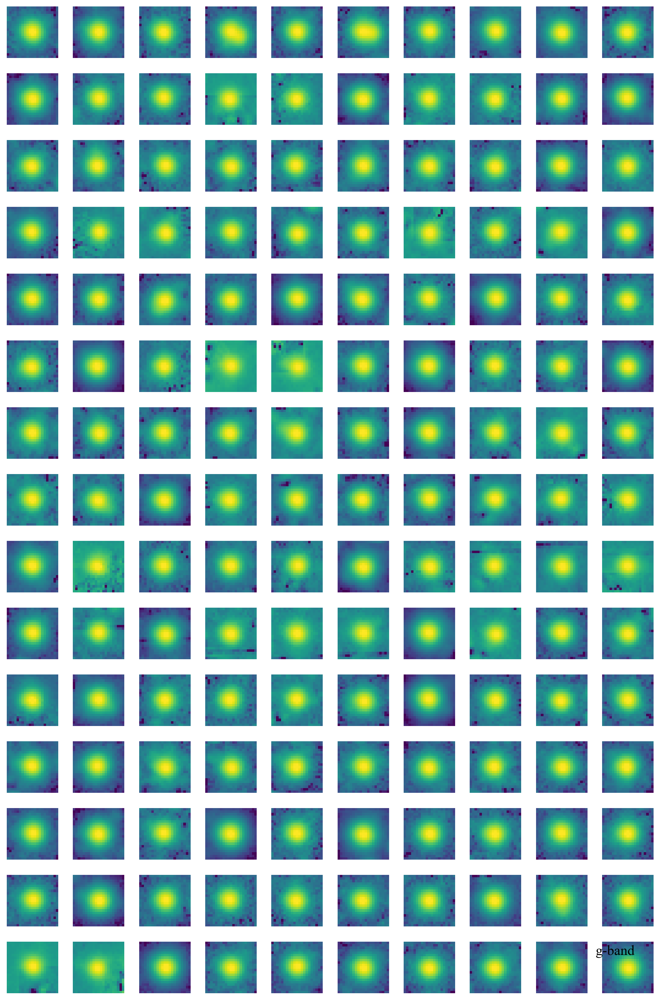

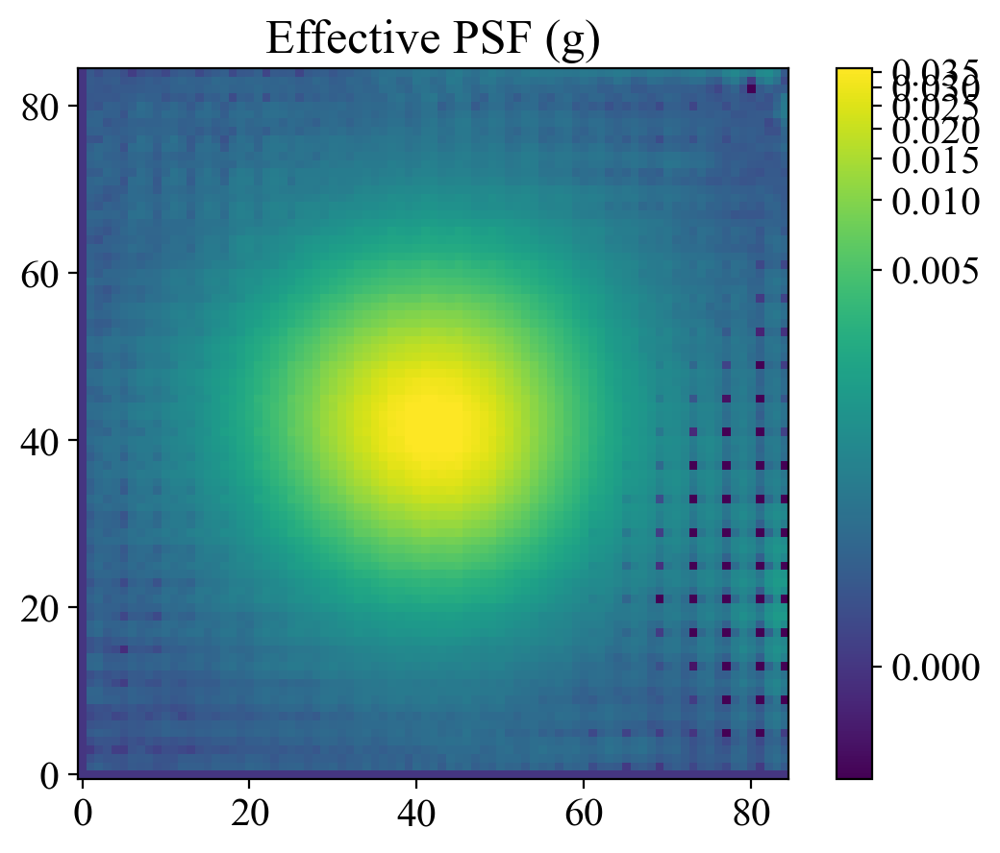

In [11]:
substars = get_substars(stars, epsf0, 2*std, fwhm_mean, band)
epsf1 = get_epsf(substars, band)

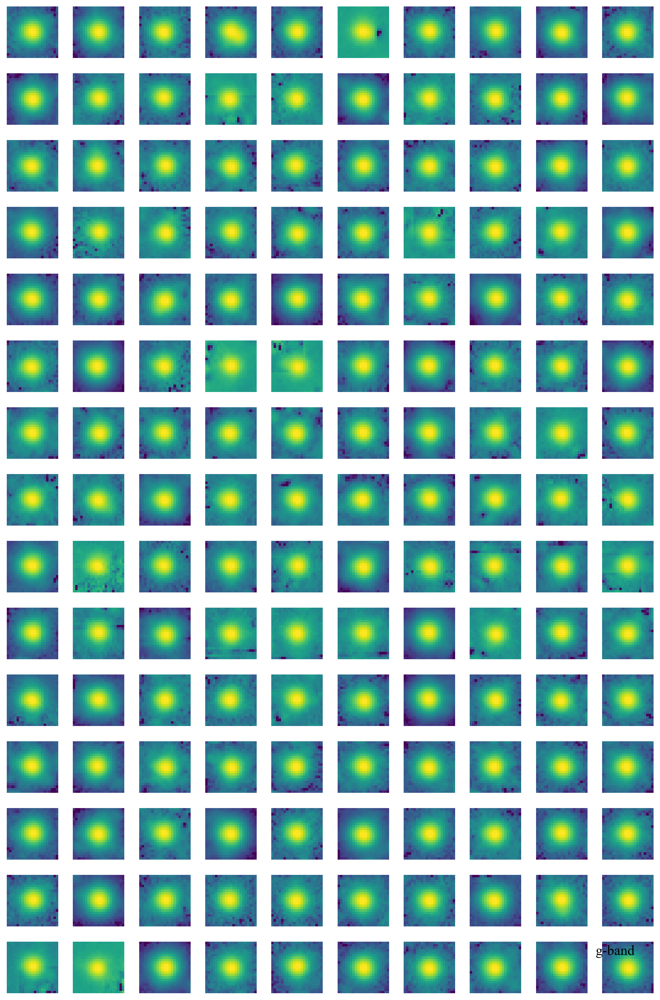

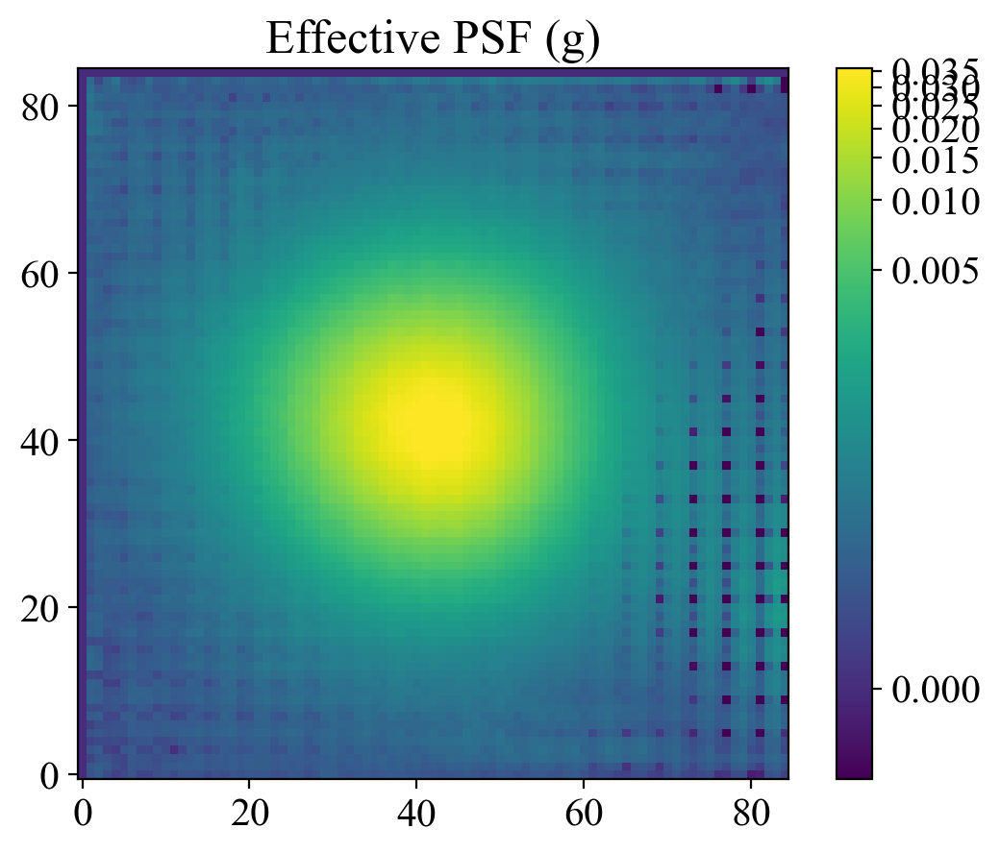

In [12]:
substars2 = get_substars(substars, epsf0, 1*std, fwhm_mean, band)
epsf2 = get_epsf(substars2, band)

In [13]:

def get_psfphot(data, mask, psf_model, fwhm, psf_size, sigma_thres=3.,
                peakmax=None):
    # set up the photometry object
    bkgrms = MADStdBackgroundRMS() 
    std = bkgrms(data) # background rms
    
    threshold = sigma_thres * std # threshold for star finding
    crit_separation = 2.0 * fwhm # critical separation for star grouping
    
    daogroup = DAOGroup(crit_separation) # grouping algorithm
    mmm_bkg = MMMBackground() # bkg estimator
    fitter = LevMarLSQFitter() # psf model fitter
    
    fsize = int(np.ceil(psf_size))
    fitshape = fsize if fsize%2 == 1 else fsize +1 # shape of the fitting region
    
    # find stars for the initial guess
    daofind = DAOStarFinder(threshold=threshold,
                            fwhm=fwhm, #sigma_psf * gaussian_sigma_to_fwhm,
                            roundhi=5.0, roundlo=-5.0,
                            sharplo=0.0, sharphi=2.0, peakmax=peakmax)
    stars = daofind(data, mask=mask)
    
    # define the photometry object
    photometry = BasicPSFPhotometry(finder=daofind,
                                    group_maker=daogroup,
                                    bkg_estimator=mmm_bkg,
                                    psf_model=psf_model,
                                    fitter=fitter,
                                    aperture_radius=1.5*fwhm,
                                    # niters=1,
                                    fitshape=fitshape)

    # rename columns to match the names in the table
    stars.rename_columns(['xcentroid','ycentroid','flux'],
                         ['x_0', 'y_0', 'flux_0'])

    start = time() # to record the time
    print('start time -', ctime(start))
    
    # run the photometry
    result_tab = photometry.do_photometry(image=data, mask=mask,
                                          init_guesses=stars,
                                          progress_bar=True)
    residual_image = photometry.get_residual_image()
    
    finish = time()
    print('finish time -', ctime(finish))
    print(f'elapsed time - {(finish-start)/60:.2f} min')

    # discard stars outside the image
    shape = data.shape
    result_tab = discard_stars_outside(shape, result_tab)

    return result_tab, photometry


def discard_stars_outside(shape, result_tab):
    ny, nx = shape
    xin = np.logical_and(result_tab['x_fit'] > 0 , result_tab['x_fit'] < nx-1)
    yin = np.logical_and(result_tab['y_fit'] > 0 , result_tab['y_fit'] < ny-1)
    isin = np.logical_and(xin, yin)
    return result_tab[isin]



In [14]:
# set fwhm, psf_model, psf_size, sigma_thres, peakmax
fwhm = fwhm_med # median fwhm of selected stars
sigma_psf = fwhm * gaussian_fwhm_to_sigma # sigma of psf
psf_model = epsf0 # epsf model - just using the epsf without iteration
psf_size = fwhm * 4 # size of psf model to fit
sigma_thres = 5.0 # threshold for star detection
peakmax = 10.0 # maximum peak value for star detection (prevent saturated stars)

# get photometry by BasicPSFPhotometry
res = get_psfphot(data, mask, psf_model, fwhm, psf_size,
                  sigma_thres=sigma_thres, peakmax=peakmax)

result_tab, photometry = res # extract result table and photometry object
residual_image = photometry.get_residual_image() # residual_image = data - model

# save results
hdu = fits.PrimaryHDU(residual_image)
hdu.writeto(DATADIR/f'res_{band}_{sigma_thres:.1f}.fits', overwrite=True)
result_tab.write(DATADIR/f'result_tab_{band}_{sigma_thres:.1f}.csv', format='csv', overwrite=True)

start time - Sun Apr  2 14:54:15 2023


Star Group:   0%|          | 0/1904 [00:00<?, ?it/s]

finish time - Sun Apr  2 14:55:00 2023
elapsed time - 0.74 min


In [ ]:
def show_psfphot_result(data, band, result_tab, residual_image):
    fig, axs = plt.subplots(1, 3, figsize=(10, 4))
    interval = ZScaleInterval()
    vmin, vmax = interval.get_limits(data)
    
    zscale_imshow(axs[0], data, vmin, vmax)
    zscale_imshow(axs[1], data - residual_image, vmin, vmax)
    zscale_imshow(axs[2], residual_image, vmin, vmax)
    axs[0].plot(result_tab['x_fit'], result_tab['y_fit'], marker='+', c='r', ms=1, ls='None')
    axs[2].text(0.95, 0.05, f'{band}-band', ha='right', va='bottom',
                   c='w', fontweight='bold', transform=axs[2].transAxes)
    axs[0].set_title('Original')
    axs[1].set_title('Model')
    axs[2].set_title('Residual')
    axs = axs.ravel()
    for ax in axs:
        ax.axis('off')
    
    plt.tight_layout()
    
    return fig

In [ ]:
# plot results - data, model, residual
fig = show_psfphot_result(data, band, result_tab, residual_image)

In [ ]:
# Let's do the same for all bands
bands = ['g', 'r', 'z']
for i in range(1, len(bands)):
    band = bands[i]
    data = ccd.data[i]
    mask = ccd.mask[i]

    print(f'### Band: {band}')
    bkgrms = MADStdBackgroundRMS()
    std = bkgrms(data)
    thres = 3*std

    find_mask = np.zeros_like(data, dtype=bool)
    ll, hh = 0, 200
    find_mask[ll:hh, ll:hh] = True
    peaks_tbl = find_peaks(data, threshold=thres, mask=find_mask)
    peaks_tbl['peak_value'].info.format = '%.8g'

    # select stars within the cutout of specified size
    size = 21
    hsize = (size - 1) / 2
    x = peaks_tbl['x_peak']  
    y = peaks_tbl['y_peak']  
    bound = ((x > hsize) & (x < (data.shape[1] -1 - hsize)) &
            (y > hsize) & (y < (data.shape[0] -1 - hsize)))
    bright = (peaks_tbl['peak_value'] > 0.5) & (peaks_tbl['peak_value'] < 10.)

    bbmask = (bound & bright)
    bx, by = x[bbmask], y[bbmask]

    isolated = [False if np.count_nonzero(np.sqrt((bx-xi)**2+(by-yi)**2)<size) > 1
                else True for xi, yi in zip(bx, by)]

    mask_stars = isolated
    mask_stars = np.ones_like(bx, dtype=bool)

    stars_tbl = Table()
    stars_tbl['x'] = bx[mask_stars]  
    stars_tbl['y'] = by[mask_stars]

    # print(stars_tbl)

    nddata = NDData(data=data, mask=ccd.mask[i])

    # plot the locations of our selected stars
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    im = zscale_imshow(ax, data, cmap='gray')
    ax.plot(stars_tbl['x'], stars_tbl['y'], '.r')
    rect = patches.Rectangle((ll,ll), hh-ll, hh-ll, ec='tab:red', ls='--',
                            hatch='/', fc='none', lw=1)
    ax.add_patch(rect)

    # extract cutouts of our selected stars
    stars = extract_stars(nddata, stars_tbl, size=size)

    # derive fwhm from aperture statistics
    cap = CircularAperture(stars.center_flat, size/5.)
    apstat = ApertureStats(data, cap)

    fwhm_mean, fwhm_med, fwhm_std = sigma_clipped_stats(apstat.fwhm.value,
                                                        sigma=3.0)

    epsf0 = get_epsf(stars, band)
#     substars = get_substars(stars, epsf0, 2*std, fwhm_mean, band)
#     epsf1 = get_epsf(substars, band)
#     substars2 = get_substars(substars, epsf0, 1*std, fwhm_mean, band)
#     epsf2 = get_epsf(substars2, band)

    fwhm = fwhm_med
    sigma_psf = fwhm * gaussian_fwhm_to_sigma
    psf_model = epsf0
    psf_size = fwhm * 4
    sigma_thres = 5.
    peakmax=10.0

    res = get_psfphot(data, mask, psf_model, fwhm, psf_size,
                    sigma_thres=sigma_thres, peakmax=peakmax)

    result_tab, photometry = res
    residual_image = photometry.get_residual_image()

    hdu = fits.PrimaryHDU(residual_image)
    hdu.writeto(DATADIR/f'res_{band}_{sigma_thres:.1f}.fits', overwrite=True)
    result_tab.write(DATADIR/f'result_tab_{band}_{sigma_thres:.1f}.csv', format='csv', overwrite=True)

    show_psfphot_result(data, band, result_tab, residual_image)

In [ ]:
# now let's bring the results together to match the stars from each band

sigma_thres = 5.0 # threshold for detection
tbls = []
for band in bands:
    tbls.append(Table.read(DATADIR/f'result_tab_{band}_{sigma_thres:.1f}.csv'))

gtbl, rtbl, ztbl = tbls # extract the tables for each band

gtbl.show_in_notebook(display_length=10)


In [ ]:
# crude and slow match of the stars from each band
# for more sophisticated matching, see the exgalcosutils.catalog.match_catalogs function
# (https://github.com/hbahk/exgalcosutils/blob/d8dc13f05237bc6c21e187d3465f4b7a12cb3469/exgalcosutils/catalog.py#L16)

def dist(x1,y1,x2,y2):
    """
    Calculate the distance between two points.
    """
    return np.sqrt((x1-x2)**2+(y1-y2)**2)

def match_stars(reftab, objtab, table_names, verbose=False,
                objcard=['x_fit', 'y_fit', 'flux_fit', 'group_id'],
                refcard=['x', 'y'], rlim=1):
    """
    Return a table matched by positions of stars in each band.
    """
    tab_list = []
    for star in reftab: # for loop is slow, but it's ok for now
        xdata, ydata = objtab[objcard[0]], objtab[objcard[1]]
        match = dist(xdata, ydata, star[refcard[0]], star[refcard[1]]) < rlim
        tab = objtab[match]
        if len(tab) == 0:
            if verbose:
                print(star['ID'], ': nothing matched with the given standard star')
        else:
            if len(tab) > 1:
                if verbose:
                    print(star['ID'], ': duplication occured in the pixel match process')
                    print(tab[objcard[2], objcard[3]])
                tab.sort(objcard[2], reverse=True)
                tab = tab[0]
            tab_list.append(hstack([star, tab], table_names=table_names))
    
    matched_tab = vstack(tab_list)
    return matched_tab

In [ ]:
print(f'g-band: {len(gtbl)} stars, r-band: {len(rtbl)} stars, z-band: {len(ztbl)} stars')

In [ ]:
# let's set the reference band to r-band, since it has the most stars.
# we will match the stars in the other bands to the r-band stars.
rlim = 3.0 # matching radius in pixel
grtbl = match_stars(rtbl, gtbl, ['r', 'g'], refcard=['x_fit', 'y_fit'], rlim=rlim)

grtbl.show_in_notebook(display_length=10)

In [ ]:
# let's check how well the matching went by plotting the difference of positions of the stars
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
ax.plot(grtbl['x_fit_r']-grtbl['x_fit_g'], grtbl['y_fit_r']-grtbl['y_fit_g'], '.k', alpha=0.5)
ax.set_xlabel('$\Delta x$ (pixel)')
ax.set_ylabel('$\Delta y$ (pixel)')

fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)
rgbimg = fits.getdata(DATADIR/'NGC2210.grz.rgb.fits')
ax.imshow(rgbimg, origin='lower')
ax.plot(grtbl['x_fit_r'], grtbl['y_fit_r'], 'xr', alpha=0.5)
ax.plot(grtbl['x_fit_g'], grtbl['y_fit_g'], 'xb', alpha=0.5)

In [ ]:
# maybe the rlim=3.0 is too large, let's try 2.0
rlim = 2.0
grtbl = match_stars(rtbl, gtbl, ['r', 'g'], refcard=['x_fit', 'y_fit'], rlim=rlim)
print(f'number of matched stars: {len(grtbl)}')

# and check again
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
ax.plot(grtbl['x_fit_r']-grtbl['x_fit_g'], grtbl['y_fit_r']-grtbl['y_fit_g'], '.k', alpha=0.5)
ax.set_xlabel('$\Delta x$ (pixel)')
ax.set_ylabel('$\Delta y$ (pixel)')

fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)
rgbimg = fits.getdata(DATADIR/'NGC2210.grz.rgb.fits')
ax.imshow(rgbimg, origin='lower')
ax.plot(grtbl['x_fit_r'], grtbl['y_fit_r'], 'xr', alpha=0.5)
ax.plot(grtbl['x_fit_g'], grtbl['y_fit_g'], 'xb', alpha=0.5)

In [ ]:
# the matching looks better now, then let's draw the color-magnitude diagram

def flux2mag(flux, zp=22.5): # the default zeropoint is set to 22.5 for the nanomaggy unit
    return -2.5*np.log10(flux) + zp

gmag = flux2mag(grtbl['flux_fit_g'])
rmag = flux2mag(grtbl['flux_fit_r'])

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(121)
ax.plot(gmag-rmag, rmag, '.k', alpha=0.5)
ax.set_xlabel('$g-r$')
ax.set_ylabel('$r$')
ax.invert_yaxis()

# let's plot the color-magnitude diagram focusing on the non-outliers
ax2 = fig.add_subplot(122)
ax2.plot(gmag-rmag, rmag, '.k', alpha=0.5)
ax2.set_xlabel('$g-r$')
ax2.set_ylabel('$r$')
ax2.invert_yaxis()
ax2.set_xlim(-0.5, 2)
ax2.set_ylim(22.5, 15)

In [ ]:
# let's compare the color-magnitude diagram with the legacy survey catalog
vertices = ccd.wcs.celestial.calc_footprint()
ralo, rahi = vertices[:,0].min(), vertices[:,0].max()
declo, dechi = vertices[:,1].min(), vertices[:,1].max()

lgs_url = 'https://www.legacysurvey.org/viewer/ls-dr10/cat.fits?'
cat_bbox = f'ralo={ralo:.4f}&rahi={rahi:.4f}&declo={declo:.4f}&dechi={dechi:.4f}'

query_url = lgs_url + cat_bbox
cathdu = fits.open(query_url)

cat = Table(cathdu[1].data)
cat.show_in_notebook(display_length=10)

In [ ]:
gcat = flux2mag(cat['flux_g']) # nanomaggy to magnitude
rcat = flux2mag(cat['flux_r'])

xcat, ycat = ccd.wcs.celestial.all_world2pix(cat['ra'], cat['dec'], 0)
cat['x'] = xcat
cat['y'] = ycat

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(121)
ax.imshow(rgbimg, origin='lower')
ax.plot(xcat, ycat, 'xr')
ax.plot(grtbl['x_fit_g'], grtbl['y_fit_g'], '+b')
ax.set_xlabel('x (pixel)')
ax.set_ylabel('y (pixel)')
ax.set_xlim(0, len(rgbimg[0]))

ax2 = fig.add_subplot(122)
ax2.plot(gmag-rmag, rmag, '.k', alpha=0.5)
ax2.plot(gcat-rcat, rcat, '.r', alpha=0.5)
ax2.set_xlabel('$g-r$')
ax2.set_ylabel('$r$')
ax2.invert_yaxis()
ax2.set_xlim(-0.5, 2)
ax2.set_ylim(22.5, 15)


In [ ]:
# let's match the stars in the catalog with the stars of our photometry
cmtbl_r = match_stars(rtbl, cat, ['our', 'cat'], refcard=['x_fit', 'y_fit'],
                    objcard=['x', 'y', 'flux_r'], rlim=rlim)

In [ ]:
# and compare the magnitude
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
crmag = flux2mag(cmtbl_r['flux_r']) # catalog r-band magnitude
ormag = flux2mag(cmtbl_r['flux_fit']) # our r-band magnitude
ax.plot(crmag, ormag, '.k', alpha=0.5)
ax.set_ylim([14.5, 21.5])
ax.set_xlim([14.5, 21.5])
ax.plot([14, 22], [14, 22], ls='--', c='tab:red', zorder=0)
ax.set_xlabel('catalog r-band magnitude')
ax.set_ylabel('our r-band magnitude')

In [ ]:
# doing the same thing in gz-band
cmtbl_g = match_stars(gtbl, cat, ['our', 'cat'], refcard=['x_fit', 'y_fit'],
                      objcard=['x', 'y', 'flux_g'], rlim=rlim)
cmtbl_z = match_stars(ztbl, cat, ['our', 'cat'], refcard=['x_fit', 'y_fit'],
                      objcard=['x', 'y', 'flux_z'], rlim=rlim)

fig, axes = plt.subplots(1, 3, figsize=(15,5))
cgmag = flux2mag(cmtbl_g['flux_g']) # catalog g-band magnitude
ogmag = flux2mag(cmtbl_g['flux_fit']) # our g-band magnitude
czmag = flux2mag(cmtbl_z['flux_z']) # catalog z-band magnitude
ozmag = flux2mag(cmtbl_z['flux_fit']) # our z-band magnitude
for ax, cmag, omag, band in zip(axes, [cgmag, crmag, czmag],
                                [ogmag, ormag, ozmag], ['g', 'r', 'z']):
    ax.plot(cmag, omag, '.k', alpha=0.5)
    ax.set_ylim([14.5, 21.5])
    ax.set_xlim([14.5, 21.5])
    ax.plot([14, 22], [14, 22], ls='--', c='tab:red', zorder=0)
    ax.set_xlabel(f'catalog {band}-band magnitude')
    ax.set_ylabel(f'our {band}-band magnitude')